SVD Image Compression Demo for HW in EECS 551  
??? Original version by ???  
2021-10-28 Julia 1.6.3 updates by Jeff Fessler (eliminate WebIO and Interact)

In [2]:
import Pkg;
Pkg.add("FileIO")

    Updating registry at `C:\Users\tpooja\.julia\registries\General.toml`
   Resolving package versions...
    Updating `C:\Users\tpooja\.julia\environments\v1.9\Project.toml`
  [5789e2e9] + FileIO v1.16.1
  No Changes to `C:\Users\tpooja\.julia\environments\v1.9\Manifest.toml`


In [4]:
import Pkg;
Pkg.add("ColorTypes")

   Resolving package versions...
    Updating `C:\Users\tpooja\.julia\environments\v1.9\Project.toml`
  [3da002f7] + ColorTypes v0.11.4
  No Changes to `C:\Users\tpooja\.julia\environments\v1.9\Manifest.toml`


In [12]:
import Pkg;
Pkg.add("Images")

   Resolving package versions...
   Installed ImageIO ─────────────────── v0.6.7
   Installed TiledIteration ──────────── v0.3.1
   Installed GR_jll ──────────────────── v0.72.8+0
   Installed ImageSegmentation ───────── v1.8.1
   Installed PNGFiles ────────────────── v0.4.1
   Installed JpegTurbo ───────────────── v0.1.4
   Installed ImageMagick ─────────────── v1.3.0
   Installed Preferences ─────────────── v1.4.1
   Installed TiffImages ──────────────── v0.6.8
   Installed LoggingExtras ───────────── v1.0.3
   Installed RelocatableFolders ──────── v1.0.1
   Installed Sixel ───────────────────── v0.1.3
   Installed RegionTrees ─────────────── v0.3.2
   Installed StaticArrays ────────────── v1.6.5
   Installed NNlib ───────────────────── v0.9.7
   Installed ConcurrentUtilities ─────── v2.3.0
   Installed ProgressMeter ───────────── v1.9.0
   Installed OpenEXR ─────────────────── v0.3.2
   Installed Images ──────────────────── v0.25.3
   Installed NearestNeighbors ────────── v0.4.13
  

        Info Packages marked with ⌃ and ⌅ have new versions available, but those with ⌅ are restricted by compatibility constraints from upgrading. To see why use `status --outdated -m`
Precompiling project...
  ✓ IndirectArrays
  ✓ StatsAPI
  ✓ LaTeXStrings
  ✓ ConcurrentUtilities
  ✓ WoodburyMatrices
  ✓ Compat
  ✓ RealDot
  ✓ PkgVersion
  ✓ Preferences
  ✓ IntervalSets
  ✓ SentinelArrays
  ✓ URIs
  ✓ ProgressMeter
  ✓ Ratios
  ✓ TranscodingStreams
  ✓ Inflate
  ✓ Adapt
  ✓ ComputationalResources
  ✓ Scratch
  ✓ ConstructionBase
  ✓ LoggingExtras
  ✓ TupleTools
  ✓ PooledArrays
  ✓ Tables
  ✓ MbedTLS
  ✓ Distances
  ✓ QOI
  ✓ Graphics
  ✓ AxisAlgorithms
  ✓ Compat → CompatLinearAlgebraExt
  ✓ Quaternions
  ✓ JLLWrappers
  ✓ FilePathsBase
  ✓ ChainRulesCore
  ✓ IntervalSets → IntervalSetsStatisticsExt
  ✓ Latexify
  ✓ PrecompileTools
  ✓ RelocatableFolders
  ✓ Ratios → RatiosFixedPointNumbersExt
  ✓ TranscodingStreams → TestExt
  ✓ ConstructionBase → ConstructionBaseIntervalSetsExt
  

  ✓ Xorg_libXrandr_jll
  ✓ TiffImages
  ✓ Cairo_jll
  ✓ Xorg_libXcursor_jll
  ✓ ImageCore
  ✓ Xorg_libXi_jll
  ✓ Xorg_xkbcomp_jll
  ✓ HarfBuzz_jll
  ✓ LineSearches
  ✓ ImageMorphology
  ✓ JpegTurbo
  ✓ ImageBase
  ✓ GLFW_jll
  ✓ Sixel
  ✓ Xorg_xkeyboard_config_jll
  ✓ libass_jll
  ✓ ImageMagick
  ✓ ImageDistances
  ✓ Optim
  ✓ PNGFiles
  ✓ ImageAxes
  ✓ ImageShow
  ✓ xkbcommon_jll
  ✓ FFMPEG_jll
  ✓ Qt5Base_jll
  ✓ ImageMetadata
  ✓ FFMPEG
  ✓ DataFrames
  ✓ GR_jll
  ✓ ImageTransformations
  ✓ Netpbm
  ✓ Latexify → DataFramesExt
  ✓ BangBang → BangBangDataFramesExt
  ✓ ImageIO
  ✓ MicroCollections
  ✓ GR
  ✓ ImageContrastAdjustment
  ✓ Transducers
  ✓ Transducers → TransducersDataFramesExt
  ✓ FLoops
  ✓ MLUtils
  ✓ MLDatasets
  ✓ ImageFiltering
  ✓ ImageSegmentation
  ✓ ImageQualityIndexes
  ✓ Plots
  ✓ Plots → IJuliaExt
  ✓ Plots → FileIOExt
  ✓ Plots → UnitfulExt
  ✓ Images
  ✓ MIRTjim
  251 dependencies successfully precompiled in 413 seconds. 85 already precompiled.
  75 dependenc

In [55]:
# packages used; you may need to add some of these
using LinearAlgebra: svd, rank, Diagonal
using FileIO
using ColorTypes
using Images # if you have issues with this package, then comment it out
#using Interact
using Plots; default(markerstrokecolor=:auto)
println("Ready!")

Ready!


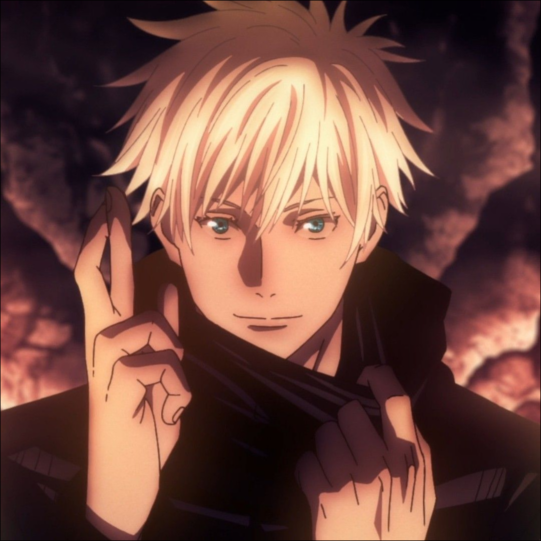

In [143]:
# Load and display an image
image_color = load("/Users/tpooja/Downloads/551testimage.jpg") # Replace with your image -- put in the same directory as this notebook

size(image_color) = (1080, 1080)


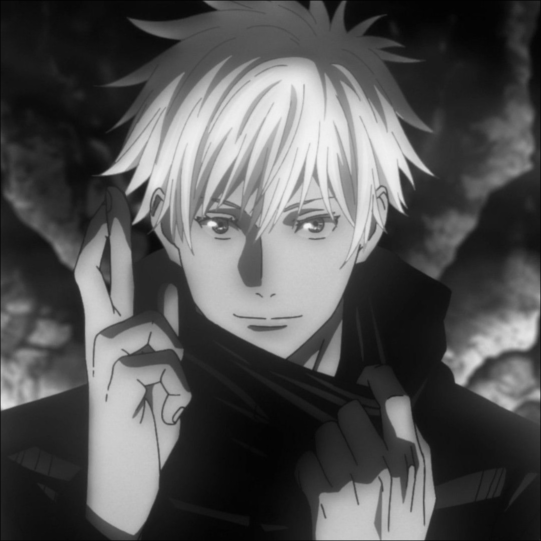

In [144]:
# Convert to gray scale for simplicity
@show size(image_color)
image_gray = Gray.(image_color)

In [145]:
# Convert to matrix of values to perform SVD
image_data = Float32.(image_gray)
typeof(image_gray)

Matrix{Gray{N0f8}} (alias for Array{Gray{Normed{UInt8, 8}}, 2})

In [146]:
# Compute SVD and rank of image matrix
U, σ, V = svd(image_data)
r = rank(Diagonal(σ)) # efficient way to find rank given singular values!
println("Rank of image matrix = $r out of $(length(σ))")

Rank of image matrix = 587 out of 1080


Let $A$ be an $M \times N$ matrix having SVD

$$A = \sum_{i=1}^r \sigma_i u_i v_i',$$

where $r$ is the rank of $A$. Consider the optimization problem:

$$ \hat{A}_K = \arg \min_{X} \| A - X \|_F, \textrm{ subject to } \mathrm{rank}(X) ≤ K.$$

Via the famous Eckart-Young theorem, we have that

$$ \hat{A}_K = \sum_{i=1}^{\min(K,r)} \sigma_i u_i v_i'.$$

Mirsky showed that if we replace the Frobenius norm
in the above optimization problem by *any* unitarily invariant norm
(e.g., the operator norm, or the nuclear norm),
then the solution remains the same!

This notebook explores low-rank approximations
of an $M \times N$ sized (grayscale) image
viewed as an $M \times N$ matrix.

In [137]:
# function to compute approximation error for a k-term approximation
# to a matrix with singular values in the vector σ
function svd_rank_k_approx_error(σ, k)
    return sum(σ[(k+1):end].^2) / sum(σ.^2)
end

svd_rank_k_approx_error (generic function with 1 method)

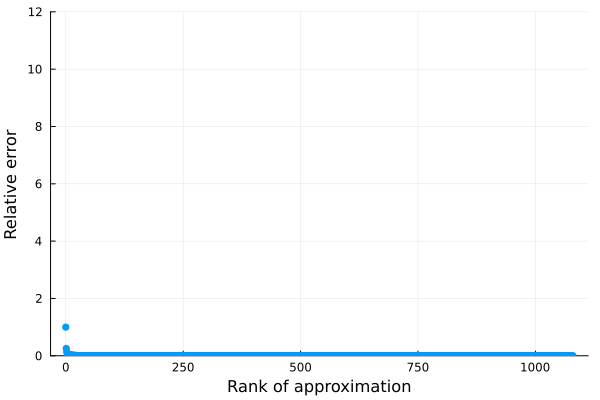

In [148]:
# Compute relative errors and plot them as a function of k
relative_error_fun = k -> svd_rank_k_approx_error(σ, k)
relative_error = relative_error_fun.(0:1080)
# Plot errors
scatter(0:1080, relative_error, label = "",
    ylabel = "Relative error",
    xlabel = "Rank of approximation", # error at 0 is 100%
    ylim = [0,12],
)

In [129]:
@show σ

σ = Float32[382.25424, 63.78964, 38.710926, 35.312252, 30.664343, 21.728466, 17.58561, 14.951534, 13.433825, 12.983173, 12.039035, 11.575436, 10.302896, 9.710054, 8.667412, 8.358384, 7.742089, 7.2048764, 6.614311, 6.336005, 5.9904933, 5.0048685, 4.8439455, 4.587507, 4.5381384, 4.192697, 3.9209034, 3.7015305, 3.5839365, 3.531837, 3.428668, 3.2240977, 3.149481, 2.978063, 2.6956427, 2.613645, 2.4970253, 2.449768, 2.3331356, 2.2110322, 2.1759207, 2.0647101, 1.9819145, 1.939154, 1.8914417, 1.7753146, 1.7295825, 1.6615604, 1.6413387, 1.5678457, 1.5663685, 1.4879833, 1.4703522, 1.3533281, 1.334596, 1.3202447, 1.2701156, 1.256386, 1.2290277, 1.1963786, 1.1502929, 1.1256305, 1.0983243, 1.0882564, 1.0635545, 1.0114748, 0.9752494, 0.9599139, 0.91238487, 0.89805275, 0.8626458, 0.8436524, 0.8348257, 0.7879807, 0.7720328, 0.75557375, 0.74497885, 0.7245141, 0.69430465, 0.6705861, 0.65796226, 0.64046127, 0.6178838, 0.6083661, 0.5844169, 0.5704062, 0.56406754, 0.5513292, 0.526022, 0.48685703, 0.4683014

244-element Vector{Float32}:
 382.25424
  63.78964
  38.710926
  35.312252
  30.664343
  21.728466
  17.58561
  14.951534
  13.433825
  12.983173
  12.039035
  11.575436
  10.302896
   ⋮
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   2.2504839f-5
   6.8287322f-6

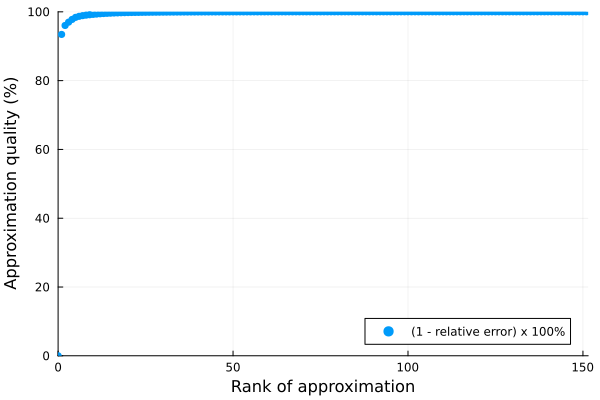

In [127]:
# Examine approximation quality vs k.
scatter(0:r, 100 * (1 .- relative_error),
    label = "(1 - relative error) x 100%",
    ylabel = "Approximation quality (%)",
    xlabel = "Rank of approximation",
    xlim = (0, r + 0.5), # adjust if needed
    ylim = (0, 100),
)

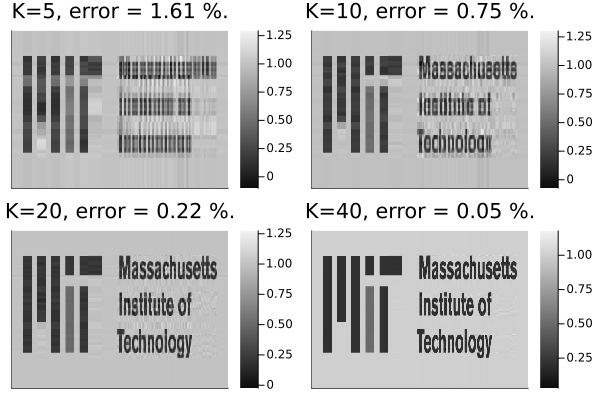

In [128]:
# See how values of k affect the visual quality of the approximation.
klist = [5, 10, 20, 40] # experiment here
ps = Array{Any}(undef, length(klist))
#@manipulate for k = klist # issues with WebIO
for (i, k) in enumerate(klist)
    image_k_matrix = U[:,1:k] * Diagonal(σ[1:k]) * V[:,1:k]'
    ps[i] = heatmap(image_k_matrix, color = :grays,
        yflip = :true, ticks = [],
        title = "K=$k, error = $(round(100*relative_error[k+1],digits=2)) %."
    )
end
plot(ps...)

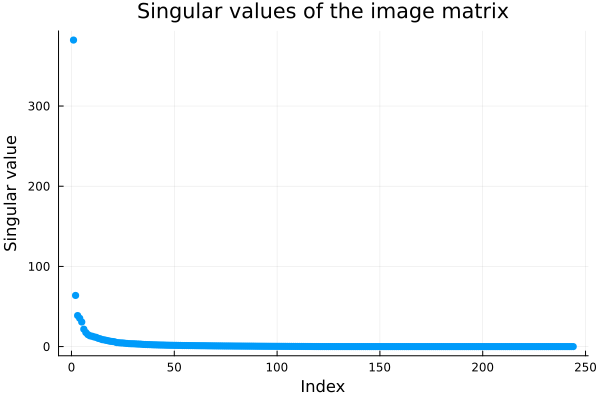

In [94]:
# plot singular values of the image
scatter(σ, label = :none,
    title = "Singular values of the image matrix",
    xlabel = "Index",
    ylabel = "Singular value",
)

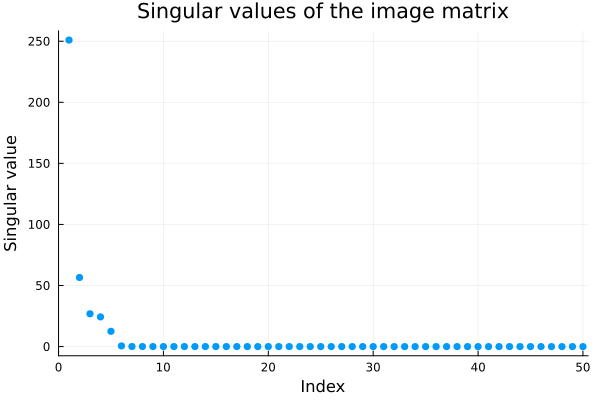

In [84]:
# Zoom in to see largest 50 singular values
ntop = 50
scatter(σ, label = :none,
    title = "Singular values of the image matrix",
    xlabel = "Index",
    ylabel = "Singular value",
    xlim = (0, ntop + 0.5),
)

In [38]:
function compress_image(A, p)
    U,s,V = svd(A)
    M = size(A,1)
    N = size(A,2)
    r = rank(Diagonal(s))
    k1 = (p*M*N)/(M+N+1)
    if k1<1
        k = 1
    else
        k = Int(floor(k1))
    end
    Ac = zeros(size(A))
    for i in 1:min(k,r)
        Ac = Ac + s[i]*U[:,i]*(V[:,i])'
    end
    return Ac
end

compress_image (generic function with 1 method)

In [40]:
compressed_gojo = compress_image(image_data,0.2)

1080×1080 Matrix{Float64}:
 0.0487939  0.0482715  0.0465175  …  0.144555   0.14011    0.126221
 0.0518408  0.0509727  0.0492162     0.14464    0.139448   0.1249
 0.0542778  0.0528099  0.0508928     0.145052   0.139171   0.123933
 0.0551332  0.0533904  0.0513861     0.144829   0.13857    0.123091
 0.0563808  0.0550428  0.0531603     0.143187   0.13613    0.120465
 0.0580637  0.0571502  0.0555521  …  0.139535   0.131121   0.115352
 0.056079   0.0554544  0.0544957     0.135571   0.126267   0.11146
 0.0527443  0.0523004  0.051906      0.132494   0.122957   0.109406
 0.0467401  0.0466738  0.047035      0.128898   0.119149   0.106769
 0.0456062  0.0457613  0.046786      0.131187   0.121044   0.109117
 0.0441719  0.0444086  0.0455223  …  0.129361   0.118693   0.10726
 0.0445664  0.0448594  0.0456912     0.122768   0.111825   0.10083
 0.0486608  0.0488886  0.0495308     0.119067   0.107776   0.0967898
 ⋮                                ⋱                        
 0.133747   0.131888   0.12789   

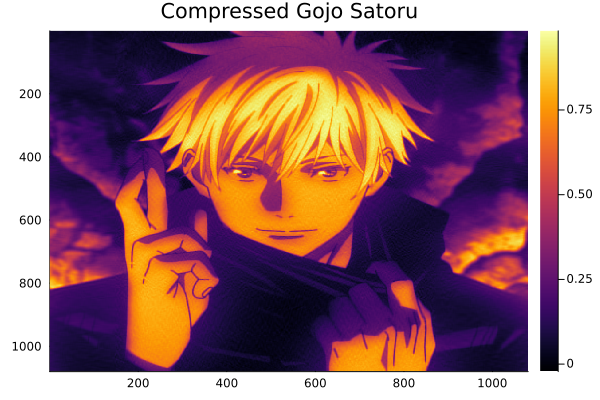

In [68]:
heatmap(compressed_gojo,yflip=true,title="Compressed Gojo Satoru")

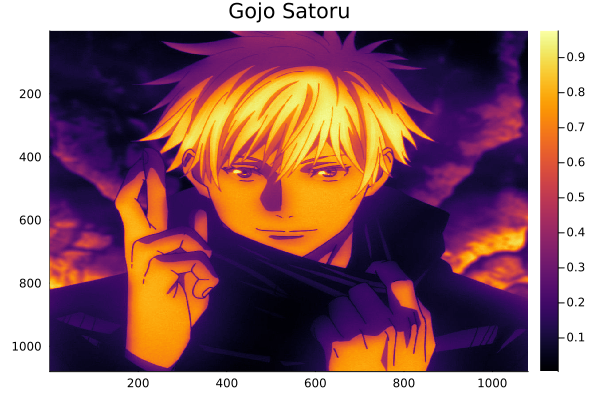

In [66]:
heatmap(image_data,yflip=true,title="Gojo Satoru")

In [59]:
import Pkg;
Pkg.add("PyPlot")

   Resolving package versions...
   Installed PyCall ─ v1.96.2
   Installed PyPlot ─ v2.11.2
    Updating `C:\Users\tpooja\.julia\environments\v1.9\Project.toml`
  [d330b81b] + PyPlot v2.11.2
    Updating `C:\Users\tpooja\.julia\environments\v1.9\Manifest.toml`
  [438e738f] + PyCall v1.96.2
  [d330b81b] + PyPlot v2.11.2
    Building PyCall → `C:\Users\tpooja\.julia\scratchspaces\44cfe95a-1eb2-52ea-b672-e2afdf69b78f\1cb97fa63a3629c6d892af4f76fcc4ad8191837c\build.log`
Precompiling project...
  ✓ BangBang → BangBangChainRulesCoreExt
  ✓ Polynomials → PolynomialsChainRulesCoreExt
  ✓ SpecialFunctions → SpecialFunctionsChainRulesCoreExt
  ✓ NNlib
  ✓ PyCall
  ✓ Polynomials → PolynomialsFFTWExt
  ✓ MicroCollections
  ✓ PyPlot
  ✓ Transducers
  ✓ MIRTjim
  ✓ Transducers → TransducersDataFramesExt
  ✓ FLoops
  ✓ MLUtils
  ✓ Sixel
  ✓ ImageMagick
  ✓ MLDatasets
  ✓ Netpbm
  ✓ ImageIO
  ✓ Images
  19 dependencies successfully precompiled in 332 seconds. 319 already precompiled.
  2 dependencies 

[ Info: Precompiling MIRTjim [170b2178-6dee-4cb0-8729-b3e8b57834cc]
┌ Warning: Module Plots with build ID fafbfcfd-1a42-886e-0008-d2f3ea5c15e9 is missing from the cache.
│ This may mean Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1793
[ Info: Skipping precompilation since __precompile__(false). Importing MIRTjim [170b2178-6dee-4cb0-8729-b3e8b57834cc].


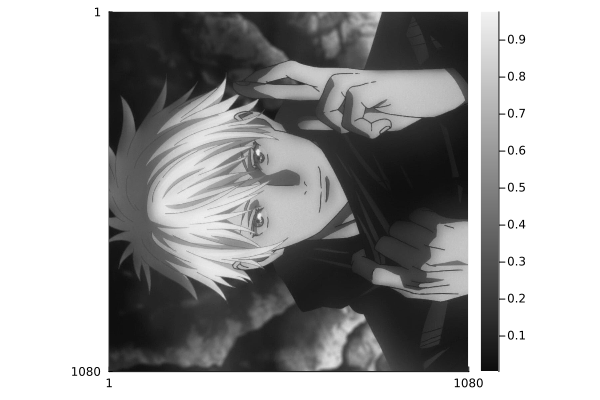

In [62]:
using MIRTjim: jim
jim(image_data)

Probably your image matrix seems to have the spectral signature
of a low-rank-signal-plus-noise type of matrix.
In this problem we do "better" in terms of approximating the image
as the rank parameter increases.
This makes it an approximation type problem.

If we were to add noise to this image
and then measure error relative to the noise-free image,
then we would see that
if the noise is large enough
then the error is best
when the approximation rank is less than the rank of signal-plus-noise matrix;
that would be a denoising problem
and insights from random matrix theory are invaluable there.
Determining whether one is operating in a denoising setup
versus an approximation setup is not always straightforward.
We say more to say about this later.

In [ ]:
# ## Optional below here
#
# Extract individual RGB channels
using Images: channelview, rawview
image_mtx = rawview(channelview(image_color)).data
red_image = Float32.(image_mtx[1,:,:])
green_image = Float32.(image_mtx[2,:,:])
blue_image = Float32.(image_mtx[3,:,:])

#### Optional question

What if we perform low-rank approximations of R, G and B matrices separately
and then combine them?
Is that approach "better" in any sense?

#### Optional question

What if we did the SVD on "patches" of the image
instead of the entire image?
A [p,q] patch of an image is a p x q rectangular subimage taken from the image.
In the patch-based approach one can imagine slicing the image up
into lots of (non-overlapping, for starters) patches,
computing an SVD of the individual patches,
and stitching them back together.
How does that work?
Try it and let us know!
You'll have to implement (or find) a Julia analog of
https://www.mathworks.com/help/images/ref/im2col.html